In [4]:
library('ggplot2')
library('reshape2')
library('ggpubr')
library(glmnet)
library(doMC)
library(survival)
library(data.table)
library(mltools)
library(CoxBoost)
library(randomForestSRC)
library(CoxHD)
library(Hmisc)
library(gridExtra)
library("survminer")
library(dplyr)
library(stringr)

source("../../../../src/tools.R")
options(repr.plot.res        = 100, # set a medium-definition resolution for the jupyter notebooks plots (DPI)
        repr.matrix.max.rows = 250, # set the maximum number of rows displayed
        repr.matrix.max.cols = 250) # set the maximum number of columns displayed

In [2]:
df_reshuffling <- NULL
for (l in list.files('../Reshuffling/')){
    if (grepl("_reshuffle_importance.tsv",l)){
        df_tmp <- read.table(paste('../Reshuffling/',l,sep=""))
        df_tmp$Ratio <- df_tmp$ref_CI/df_tmp$permuted_CI
        df_tmp <- df_tmp[,c("feature","Ratio","algo","model")]
        df_reshuffling <- rbind(df_reshuffling,df_tmp)     
    }
}
dim(df_reshuffling)

[1] 976800      4

In [27]:
df_final <- read.table("../prognosis_dataframe.tsv")
eln <- colnames(df_final[,c(2,3,4)])
comp <- colnames(df_final[,c(184,198:213)])

all_gen <- c(5:88)
vect <- apply(X=df_final[,all_gen],2,FUN=function(x) 100*length(which(x==1))/dim(df_final)[1])
gen <- colnames(df_final[,match(names(vect[vect>=2]),names(df_final))])
              
all_cyto <- c(89:158)
vect <- apply(X=df_final[,all_cyto],2,FUN=function(x) 100*length(which(x==1))/dim(df_final)[1])
cyto <- colnames(df_final[,match(names(vect[vect>=2]),names(df_final))])
              
clin <- colnames(df_final[,c(159:165)])
demo <- colnames(df_final[,c(166:167)])

              
pal <- c(eln="#EE9937",comp="#59A08B",gen="#BFBFBF",cyto="#2b8cbe",clin="#870C14",demo="#a6bddb")    


In [30]:
unique(feature_model$algo)

[1] "LASSO"       "RIDGE"       "ELASTIC_NET" "RFX"         "RFS"        
[6] "COX"

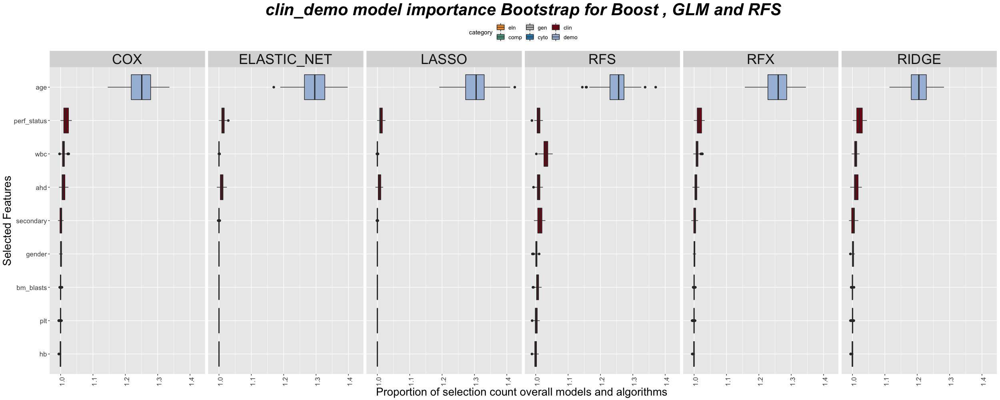

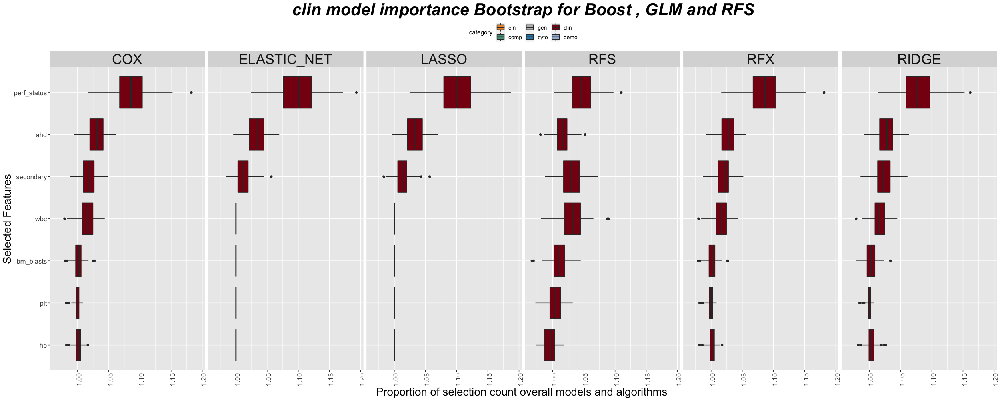

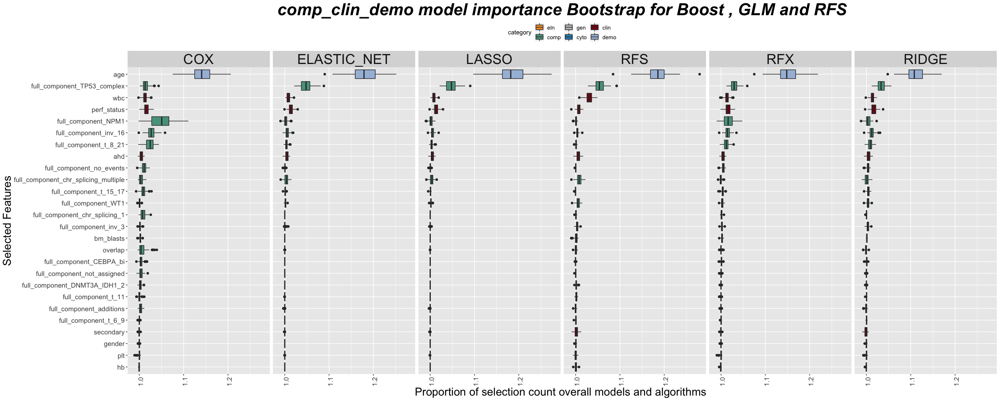

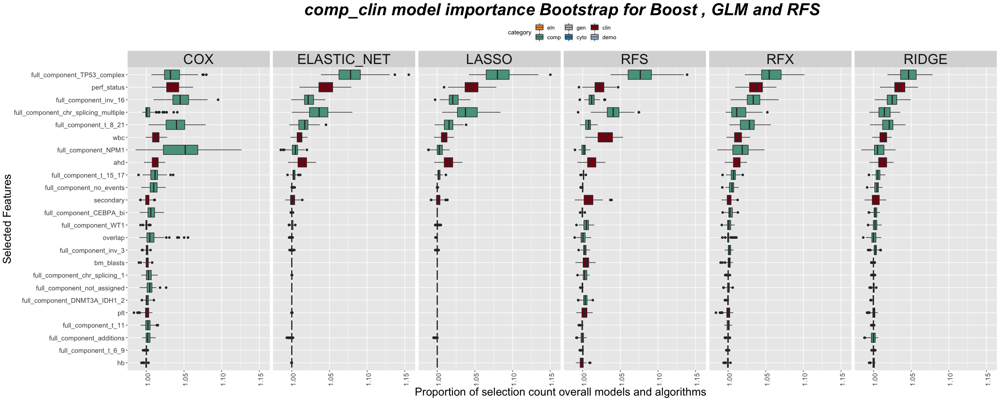

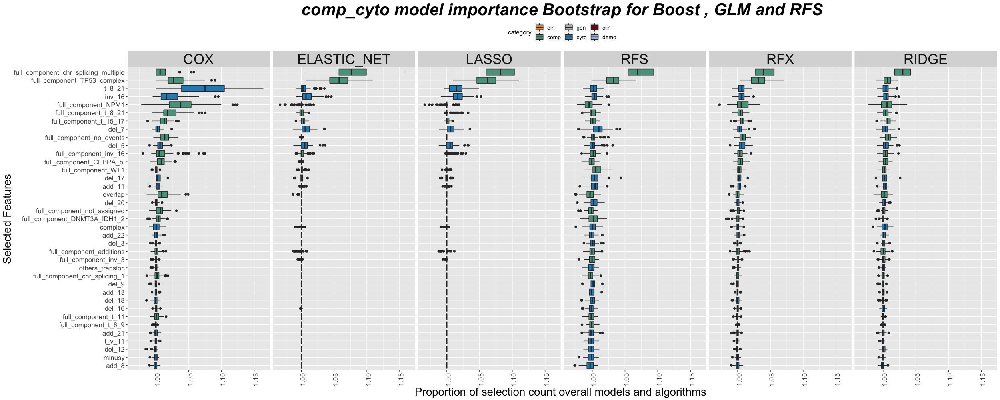

...

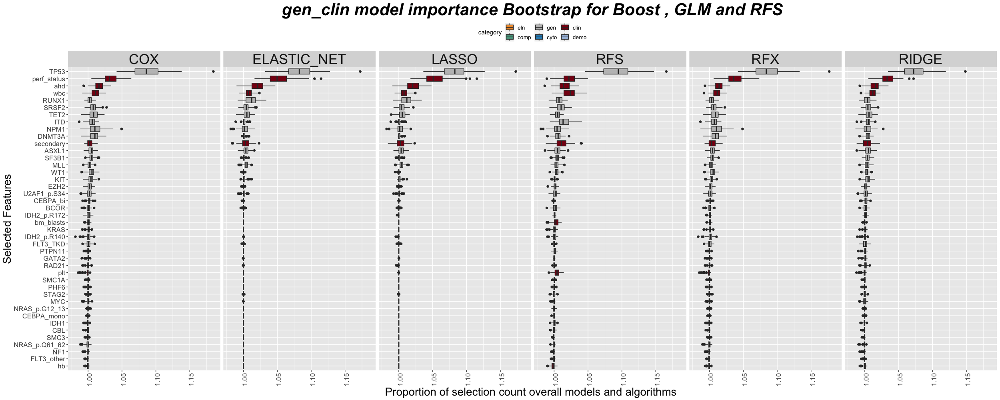

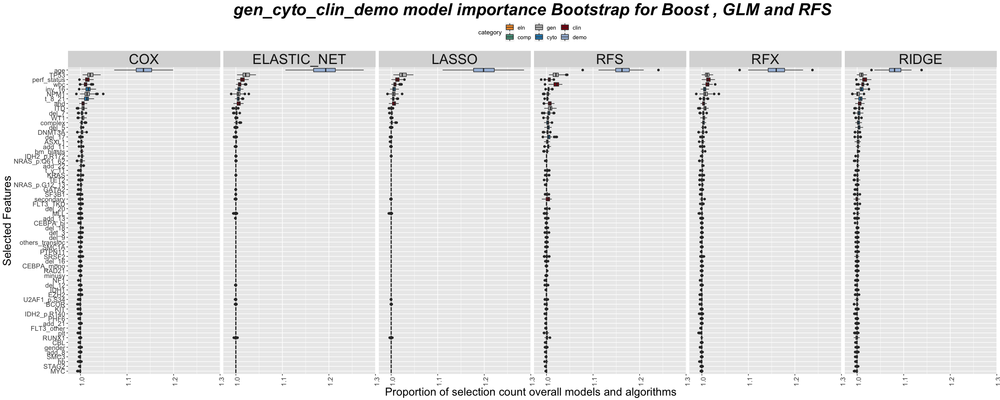

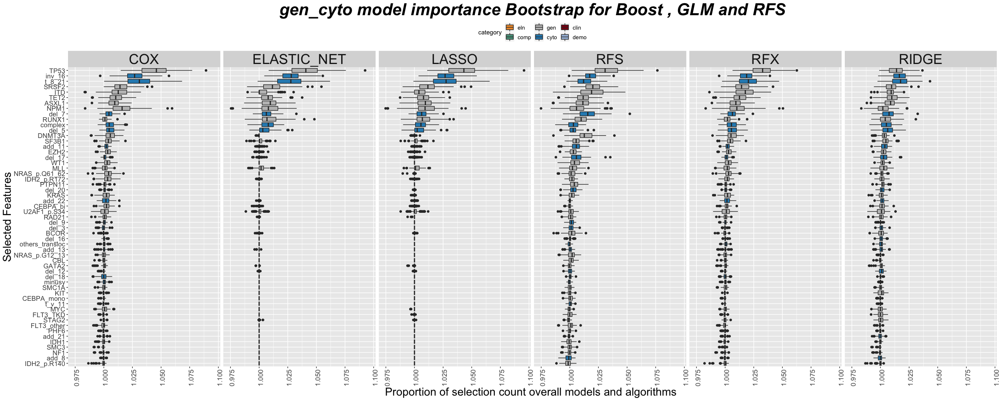

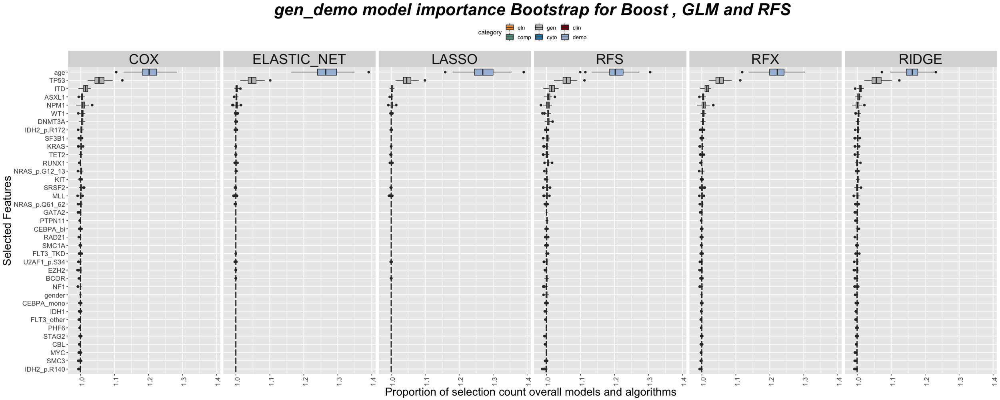

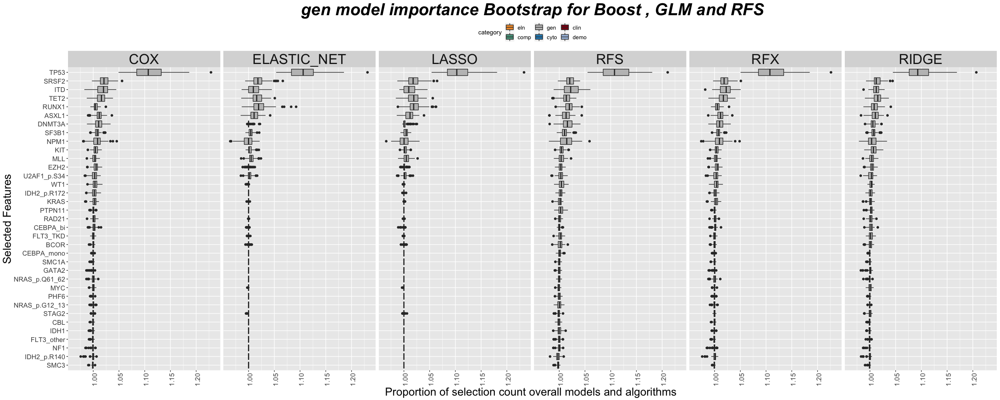

In [29]:
set_notebook_plot_size(25,10)
for (model in unique(df_reshuffling$model)){
    feature_model <- df_reshuffling[df_reshuffling$model==model ,] 
    #%>% filter(str_detect(model, c("0.7|0|1|boost|rfs")))
    
    feature_model <- feature_model[,c('feature','Ratio','algo')] %>% group_by(feature,algo)  
    #%>% summarize_all(sum)
    
    feature_model$category <- ifelse(is.element(feature_model$feature,eln),"eln",
                                   ifelse(is.element(feature_model$feature,comp),"comp",
                                         ifelse(is.element(feature_model$feature,gen),"gen",
                                               ifelse(is.element(feature_model$feature,cyto),"cyto",
                                                     ifelse(is.element(feature_model$feature,clin),"clin","demo")))))

    feature_model$algo <- toupper(feature_model$algo)
    #feature_model$Ratio <- feature_model$Ratio/100
    
    p <- ggplot(na.omit(feature_model),aes(x=reorder(feature,Ratio),y=Ratio,fill=category))+geom_boxplot()+facet_wrap(~algo,ncol=6)+
    theme(plot.title = element_text( size=30, face="bold.italic",hjust=0.5),legend.text=element_text(size=10),legend.position="top",
      axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=12),axis.text.y=element_text(size=12),
      axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20),strip.text = element_text(size=25))+xlab("Selected Features") +
    ylab("Proportion of selection count overall models and algorithms ") + ggtitle(paste(model, "model importance Bootstrap for Boost , GLM and RFS"))+coord_flip() +scale_fill_manual(values=pal,limits=names(pal))

    
    
    grid.arrange(p)
}
